# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


## Описание задачи

Проект направлен на анализ данных о заведениях общественного питания в Москве. Задачи включают исследование распределения заведений по категориям, анализ количества посадочных мест, определение соотношения сетевых и несетевых заведений, выявление популярных сетей и административных районов. Также проводится анализ средних рейтингов, ценовых индикаторов по районам и выявление топ-15 улиц с наибольшим количеством заведений. Завершается проект визуализацией на карте и исследованием взаимосвязей в данных, таких как часы работы, рейтинги и средние чеки. В части посвященной детализированному исследованию предполагается, что заказчик определился с типом заведения и нужно ответить на интересующие вопросы.
    

## Описание данных

*Файл moscow_places.csv*

- name — название заведения;


- address — адрес заведения;


- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;


- hours — информация о днях и часах работы;


- lat — широта географической точки, в которой находится заведение;


- lng — долгота географической точки, в которой находится заведение;


- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);


- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;


- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;


- middle_avg_bill — число с оценкой среднего чека;


- middle_coffee_cup — число с оценкой одной чашки капучино;


- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;


- district — административный район, в котором находится заведение, например Центральный административный округ;


- seats — количество посадочных мест.

## Общий анализ данных

In [1]:
import pandas as pd
from plotly import graph_objects as go 
import plotly.express as px
import matplotlib.pyplot as mpl
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json
import seaborn as sns
import matplotlib.pylab as plt

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv', sep = ',')

In [3]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


## Предобработка данных

In [6]:
# Проверим дупликаты
data.duplicated().sum()

0

In [7]:
data.duplicated(['name', 'address']).sum()

0

Дупликаты не выявлены

In [8]:
# Проверим пропуски
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В датасете присутствуют пропуски в столбцах: часы работы, ценовой сегмент, средний счет, середина среднего счета, средняя цена чашки кофе, количество посадочных мест. Заменить пропуски не представляется возможным, так как эту информацию не возможно восстановить.


In [9]:
# Cоздадим столбец с названием улицы
data['street'] = data['address'].apply(lambda x: x.split(sep=', ')[1])

# Создадим столбец о режиме работы 24/7
print(data['hours'].unique())
print()
print('Всего круглосуточных заведений без выходных:', data['hours'].str.contains('ежедневно, круглосуточно').sum())

data['24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')


['ежедневно, 10:00–22:00'
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00'
 'ежедневно, 09:00–22:00' ... 'пн-пт 08:30–21:30; сб,вс 09:00–21:30'
 'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00'
 'пн-сб 10:30–21:30']

Всего круглосуточных заведений без выходных: 730


In [10]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
street                  0
24/7                  536
dtype: int64

Пропусков в столбце 24/7 ровно столько же сколько и в часах работы, заполнение столбца прошло успешно

## Анализ данных

### Исследование числа заведений по категориям


In [11]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [12]:
cat = data['category'].value_counts().to_frame()
cat = cat.reset_index()
cat = cat.rename(columns = {'index':'category', 'category':'count'})
cat

,category,count
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [13]:
fig = go.Figure(data = [go.Pie(values=cat['count'], 
                               labels=cat['category'])])
fig.update_layout(title='Доля заведений в Москве по категориям', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.22, 
                                    y=1.05,
                                    text='Категории заведений:',
                                    showarrow=False)])
fig.show() 

In [14]:
# Строим столбчатую диаграмму 
fig = px.bar(cat, 
             x='count', 
             y='category', 
             text='count' 
            )

# Оформляем график
fig.update_layout(title='Число заведений в Москве по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категории')
fig.show() 

Самыми частыми из представленных категорий являются: кафе - 28% и ресторан - 24%. Намного реже встречаются булочные (3%) или столовые (4%).

### Исследование числа посадочных мест по категориям

Text(0.5, 0, 'Средняя оценка заведений')

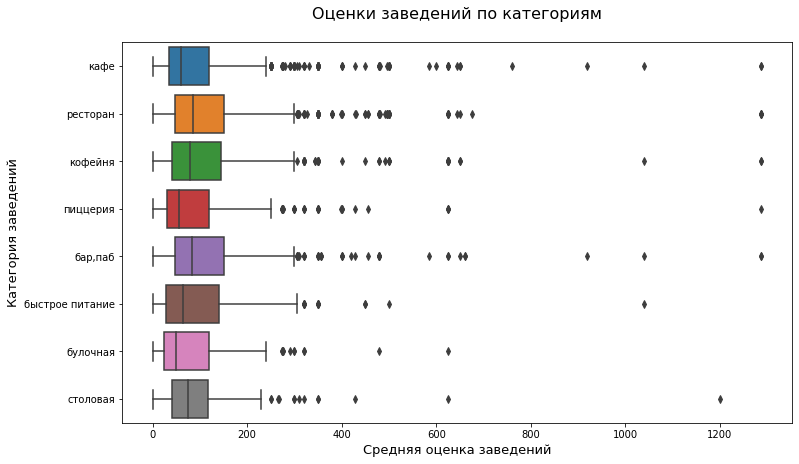

In [15]:
plt.figure(figsize=(12, 7))

ax = sns.boxplot(x="seats",
                 y="category",
                 data=data)

ax.set_title('Оценки заведений по категориям' + '\n', fontsize = 16)
ax.set_ylabel('Категория заведений', fontsize = 13)
ax.set_xlabel('Средняя оценка заведений', fontsize = 13)

Text(0.5, 0, 'Средняя оценка заведений')

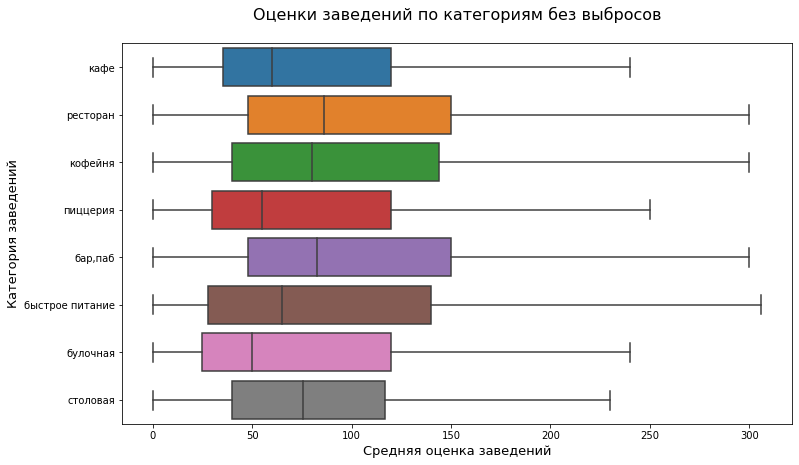

In [16]:
plt.figure(figsize=(12, 7))

ax = sns.boxplot(x="seats",
                 y="category",
                 data=data,
                 showfliers=False)

ax.set_title('Оценки заведений по категориям без выбросов' + '\n', fontsize = 16)
ax.set_ylabel('Категория заведений', fontsize = 13)
ax.set_xlabel('Средняя оценка заведений', fontsize = 13)

Из-за значительных выбросов были отброшены они для оценки медианы. Больше всего посадочных мест приходится на рестораны (медианное значение - 86), бары и пабы (83 места) так же не далеко отстают от них, меньше всего посадочных мест выделяют булочные - 50, что впринципе не так то и мало. 

### Соотношение сетевых и не сетевых заведений

In [17]:
let = data[data['chain'] == 1]['address'].value_counts().to_frame()
l = len(let)
print('Всего сетевых заведений:', l)

Всего сетевых заведений: 2438


In [18]:
print('Всего заведений:', len(data['address'].value_counts().to_frame()))

Всего заведений: 5753


Таким образом сетевых заведений заметно меньше чем не сетевых, проверим на сколько

In [19]:
n = len(data['address'].value_counts().to_frame())
per = round(l*100/(n+l), 2)
print(f'Сетевые заведения составляют {per}% от общего числа фирм')

Сетевые заведения составляют 29.76% от общего числа фирм


### Какие категории заведений чаще являются сетевыми?

Далее необходимо посчитать какие категории более популярны у сетевых заведений

In [20]:
chain = data[data['chain'] == 1]['category'].value_counts().to_frame()
chain = chain.reset_index()
chain = chain.rename(columns = {'index':'category', 'category':'chain'})
chain = chain.sort_values(by = 'category')
chain

,category,chain
5,"бар,паб",169
6,булочная,157
4,быстрое питание,232
0,кафе,779
2,кофейня,720
3,пиццерия,330
1,ресторан,730
7,столовая,88


In [21]:
n_chain = data[data['chain'] == 0]['category'].value_counts().to_frame()
n_chain = n_chain.reset_index()
n_chain = n_chain.rename(columns = {'index':'category', 'category':'n_chain'})
n_chain = n_chain.sort_values(by = 'category')
n_chain

,category,n_chain
3,"бар,паб",596
7,булочная,99
4,быстрое питание,371
0,кафе,1599
2,кофейня,693
5,пиццерия,303
1,ресторан,1313
6,столовая,227


In [22]:
pers = chain.merge(n_chain, on = 'category')
pers['per'] = round((pers['chain']/(pers['chain'] + pers['n_chain']))*100, 2)
pers = pers.sort_values(by = 'per')

In [23]:
# Строим столбчатую диаграмму 
fig = px.bar(pers, 
             x='per', 
             y='category', 
             text='per' 
            )

# Оформляем график
fig.update_layout(title='Процент сетевых заведений в каждой категории',
                   xaxis_title='Процент сетевых заведений',
                   yaxis_title='Категории заведений')
fig.show() 

In [25]:
fig = go.Figure(data = [go.Pie(values=chain['chain'], 
                               labels=chain['category'])])
fig.update_layout(title='Частые категории заведений в сетевых организациях', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.22, 
                                    y=1.05,
                                    text='Категории заведений:',
                                    showarrow=False)])
fig.show() 

### Tоп-15 популярных сетей в Москве

In [26]:
top15 = data[data['chain'] == 1].groupby('name').agg({'category' : pd.Series.mode, 'address' : 'count'})
top15 = top15.rename(columns={'address':'count'})
top15 = top15.sort_values('count', ascending = False).reset_index().head(20)
top15

,name,category,count
0,Шоколадница,кофейня,120
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,50
7,Хинкальная,кафе,44
8,КОФЕПОРТ,кофейня,42
9,Кулинарная лавка братьев Караваевых,кафе,39


In [27]:
fig = px.bar(top15,
             x='count',
             y='name',
             text='count',
             color='name',
             height=500,
             width=1000
             )
fig.update_layout(title = 'Топ-15 популярных сетей Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений',
                  showlegend = False)
fig.show()

* В выделенном топе присутствуют как известные сети (Додо, Теремок, Шоколадница), так и местные компании.
* В целом в топе много заведений, ориентированных на невысокий средний чек и большую проходимость
* Можно было бы ещё подметить, что появление `Яндекс.Лавки` очень странное, ведь это не совсем ресторан, кафе)    
* Подозрительные заведения в топе `Хинкальная`, не критично, но вероятнее это не сеть, а просто название заведений определенного вида 

In [28]:
top_cat = top15['category'].value_counts().to_frame().reset_index()
top_cat

,index,category
0,кофейня,7
1,кафе,6
2,ресторан,3
3,пиццерия,2
4,булочная,1
5,быстрое питание,1


In [29]:
fig = go.Figure(data = [go.Pie(values=top_cat['category'], 
                               labels=top_cat['index'])])
fig.update_layout(title='Частые категории заведений в топ 15 заведениях Москвы', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.22, 
                                    y=1.05,
                                    text='Категории заведений:',
                                    showarrow=False)])
fig.show()

Из выделенного списка заведений самые частые - это кофейни и кофе.

### Количество заведений каждой категории по районам

In [30]:
district = data.groupby(['district', 'category']).agg({'name': 'count'}).reset_index()
district = district.rename(columns={'name': 'count'}).sort_values( by = 'count', ascending = False)
district.head(10)

,district,category,count
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
3,Восточный административный округ,кафе,272
27,Северо-Восточный административный округ,кафе,269
67,Южный административный округ,кафе,264
11,Западный административный округ,кафе,239
59,Юго-Западный административный округ,кафе,238


In [31]:
fig = px.bar(district,
             x='count',
             y='district',
             color='category'
            )
fig.update_layout(title = 'Количество заведений по районам Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название района',
                  
                  
)
fig.show()

Всего в датасете 9 районов, наиболее востребованным является Центральный. В Центральном районе преобладают рестораны и кафе. Оно и не удивительно ведь это самый посещаемый район столицы. 

### Распределение средних рейтингов по категориям заведений и округам

In [32]:
dist_rating = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
dist_rating.sort_values(by = 'rating', ascending = False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Наибольший средний рейтинг так же в Центральном районе, хуже всего показал результат Юго-Восточный округ.

In [33]:
rating = data.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


Средний рейтинг довольно сильно отличатся в разных категориях. Бары и пабы получают более высокие оценки, а рестораны быстрого питания самые низкие.

Text(0.5, 0, 'Средняя оценка заведений')

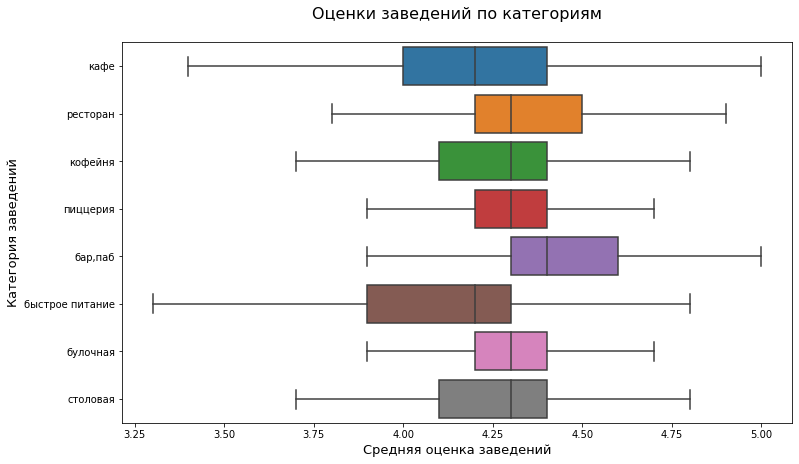

In [34]:
plt.figure(figsize=(12, 7))

ax = sns.boxplot(x="rating", 
                 y="category", 
                 data=data,
                 showfliers=False) 

ax.set_title('Оценки заведений по категориям' + '\n', fontsize = 16)
ax.set_ylabel('Категория заведений', fontsize = 13)
ax.set_xlabel('Средняя оценка заведений', fontsize = 13)

Кафе и заведения быстрого питания имеют большой хвост распределения в сторону низких оценок. Еслт сравнивать медианы, то пабы и бары так же находятся в фаворитах. Отметим, что у кафе медианная оценка находится на низком уровне.

### Рейтинги заведений на карте Москвы

Нанесем на карту Москвы границы районов с цветовым обозначением рейтинга заведений в каждом из них

In [35]:
geo_map = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng])

Choropleth(
    geo_data=geo_map,
    data=dist_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

### Все заведения датасета

Добавим на карту Москвы кластер со всеми заведениями, названием и рейтингом

In [36]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_cluster(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
data.apply(create_cluster, axis=1)
m

### Топ 15 улиц по числу заведений

In [37]:
# Отберем топ 15 улиц по количеству заведений
top15_str = data['street'].value_counts().reset_index().head(15)
top15_str.columns = ['street', 'count']

str_2 = data.groupby(['street', 'category'])['name'].count().reset_index()
str_2.columns = ['street', 'category', 'count']
str_2.sort_values('count', ascending=False)

top15_str_category = str_2[str_2['street'].isin(top15_str['street'])]
top15_str_category

,street,category,count
683,Варшавское шоссе,"бар,паб",6
684,Варшавское шоссе,быстрое питание,7
685,Варшавское шоссе,кафе,18
686,Варшавское шоссе,кофейня,14
687,Варшавское шоссе,пиццерия,4
...,...,...,...
3434,улица Миклухо-Маклая,быстрое питание,4
3435,улица Миклухо-Маклая,кафе,21
3436,улица Миклухо-Маклая,кофейня,4
3437,улица Миклухо-Маклая,пиццерия,2


In [38]:
fig = px.bar(top15_str_category, 
             x='count', 
             y='street',                    
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по топ 15 улицам общепита',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

* Любопытные отличия некоторых улиц по составу заведений, так например на МКАДе не так много баров-пабов, что в принципе логично
* Обращаю внимание, что дело в длине этих улиц, часть из них выдают такое большое число заведений именно за счёт длины

### Улицы с 1 объектом общепита

Отберем улицы со  всего 1 заведением

In [39]:
stre = data['street'].value_counts().reset_index()
stre.columns = ['street', 'count_cafe']
stre_one = stre[stre['count_cafe']==1]
stre_one

,street,count_cafe
990,Братеевский парк,1
991,Коломенская набережная,1
992,Большой Николопесковский переулок,1
993,Дербеневская улица,1
994,Конюшковская улица,1
...,...,...
1443,парк Зюзино,1
1444,Каргопольская улица,1
1445,улица Константина Федина,1
1446,Яковоапостольский переулок,1


In [40]:
category_one_str = str_2[str_2['street'].isin(stre_one['street'])]
category_one_str = category_one_str.groupby('category')['street'].count().sort_values(ascending=False)
category_one_str

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

На таких улицах обычно расположены кафе или рестораны.

### Медиана средней стоимости заказа по районам

In [41]:
bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [42]:
mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=geo_map,
    data = bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Средний чек заведений по районам',
).add_to(mm)

mm

В Центральном и Западном районе объекты приносят в среднем более дорогие чеки

### Наблюдения и выводы

- Наиболее часто встречаемый вид заведений: кафе, ресторан, кофейня
- Больше всего посадочных мест в ресторанах, пабах и кофейнях
- В Москве большинство объектов общепита являются несетевыми
- Кафе наиболее популярно у сетевых фирм
- В топ 15 заведений Москвы по количеству филиалов целых 5 кофеен
- Самая популярная сеть в Москве - Шоколадница. На втором - Доминос Пицца, на третьем месте - Додо пицца
- Самые высокие оценки у пабов, ресторанов и пиццерий. Относительно районов Центральный административный округ и Северный административный округ показали лучшие результаты
- Больше всего заведений располагаются в Центральном округе Москвы.
- Больше всего заведений на проспекте Мира. Преобладают кафе и рестораны. Далее идет Профсоюзная улица. По заведениям ситуация схожая.
- 458 улиц имеют только одно заведение
- Самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе

## Детализированое исследование

В последней части проекта предполагается, что заказчик определился с типом заведения и хочет открыть кофейню. Будем считать, что они не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. В заключительной части работы необходимо  ответить на уточняющие относительно кофеен вопросы. Построить визуализации и дать рекомендацию для открытия нового заведения.

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [43]:
l = len(data[data['category'] == 'кофейня'])
print('Количество кофеен в датасете:', l)

Количество кофеен в датасете: 1413


In [44]:
cofe = data[data['category'] == 'кофейня']
cofe['district'].value_counts()

Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: district, dtype: int64

Больше всего кофеен в центральном и северном округе, меньше всего в северо-западном

Есть ли круглосуточные кофейни?


In [45]:
cofe_24_7 = cofe[cofe['24/7'] == True]
l = len(cofe_24_7)
print('Количество круглосуточных кофеен:', l)

Количество круглосуточных кофеен: 59


In [46]:
cofe_24_7 = cofe_24_7['district'].value_counts().to_frame().reset_index()
cofe_24_7

,index,district
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Северный административный округ,5
4,Восточный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Южный административный округ,1
8,Юго-Восточный административный округ,1


Круглосуточных кофеен больше всего в центральном округе, западном и юго-западном. Меньше всего в Юго-Восточном

In [47]:
fig = px.bar(cofe_24_7, 
             x='district', 
             y='index',                    
             color='index'
            )

fig.update_layout(title='Количество круглосуточных кофеен',
                   xaxis_title='Количество кофеен',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'},
                  showlegend = False
                 )
fig.show()

Какие у кофеен рейтинги? Как они распределяются по районам?


In [48]:
cofe_rating = cofe.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
cofe_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [49]:
n = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=geo_map,
    data = cofe_rating,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    legend_name = 'Рейтинги заведений',
).add_to(n)

n

У кофеен рейтинги 4.2 - 4.34 (на среднем уровне), самые высокие рейтинги в: Центральном округе, Северо-Западном округе. Самые низкие рейтинги в Северо-Восточном и Западном округе.	

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [50]:
price_dist = cofe.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
price_dist

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [51]:
price = round(price_dist['middle_coffee_cup'].mean(), 2)
print(f'Средняя стоимость чашки кофе в Москве:', price)

Средняя стоимость чашки кофе в Москве: 171.32


In [52]:
nn = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=geo_map,
    data = price_dist,
    columns = ['district', 'middle_coffee_cup'],
    key_on = 'feature.name',
    fill_color='YlGn',
    legend_name = 'Средняя цена чашки кофе',
).add_to(nn)

nn

Средняя стоимость кофе разнится от района к району (190-151 р.)
По городу средняя стоимость 171.32 р., поэтому стоит ориентироваться на эту цифру и на среднее в конкретном районе открытия если кофейня будет расположена в только в одном районе.

**Заключение** 

В ходе детализированного иссследования были получены следующие выводы:

* Кофейни пользуются большим спросом, а так же сетевые фирмы уделяют им особое внимание

* В Западном административном округе относительно низкие рейтинги кофеен, как следствие пониженная конкуренция

* В Западном округе так же выше средняя цена чашки кофе, что делает открытие там кофейни более обоснованным

* В Западном районе не так много круглосуточных кофеен, стоит попробовать занять эту нишу

* Помимо прочего в Западном районе один из самых высоких средних чеков в сфере общепита, что показывает готовность жителей платить за качественное обслуживание


Для открытия кофейни рекомендуется выбрать Западный район, а так же круглосуточный режим работы